<a href="https://colab.research.google.com/github/YusrilHasanuddin/BATIK-WGAN-WGAN-GP/blob/main/WGAN_GP_Playground.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/YusrilHasanuddin/DataSetBatik

Cloning into 'DataSetBatik'...
remote: Enumerating objects: 41974, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 41974 (delta 3), reused 9 (delta 2), pack-reused 41963
Receiving objects: 100% (41974/41974), 2.26 GiB | 32.57 MiB/s, done.
Resolving deltas: 100% (10/10), done.
Checking out files: 100% (35504/35504), done.


In [2]:
!mkdir data
!mv DataSetBatik/CitraBatik/* data
!ls data

001-001.jpg  060-018.jpg  119-035.jpg  178-052.jpg  237-069.jpg  296-086.jpg
001-002.jpg  060-019.jpg  119-036.jpg  178-053.jpg  237-070.jpg  296-087.jpg
001-003.jpg  060-020.jpg  119-037.jpg  178-054.jpg  237-071.jpg  296-088.jpg
001-004.jpg  060-021.jpg  119-038.jpg  178-055.jpg  237-072.jpg  296-089.jpg
001-005.jpg  060-022.jpg  119-039.jpg  178-056.jpg  237-073.jpg  296-090.jpg
001-006.jpg  060-023.jpg  119-040.jpg  178-057.jpg  237-074.jpg  296-091.jpg
001-007.jpg  060-024.jpg  119-041.jpg  178-058.jpg  237-075.jpg  296-092.jpg
001-008.jpg  060-025.jpg  119-042.jpg  178-059.jpg  237-076.jpg  296-093.jpg
001-009.jpg  060-026.jpg  119-043.jpg  178-060.jpg  237-077.jpg  296-094.jpg
001-010.jpg  060-027.jpg  119-044.jpg  178-061.jpg  237-078.jpg  296-095.jpg
001-011.jpg  060-028.jpg  119-045.jpg  178-062.jpg  237-079.jpg  296-096.jpg
001-012.jpg  060-029.jpg  119-046.jpg  178-063.jpg  237-080.jpg  296-097.jpg
001-013.jpg  060-030.jpg  119-047.jpg  178-064.jpg  237-081.jpg  296-098.jpg

In [3]:
path = "data/"


import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [4]:
train_images = tf.keras.utils.image_dataset_from_directory(
    path, label_mode=None, image_size=(64, 64), batch_size=64 # update from 32
)

Found 35500 files belonging to 1 classes.


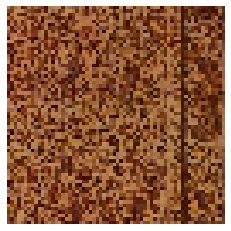

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()

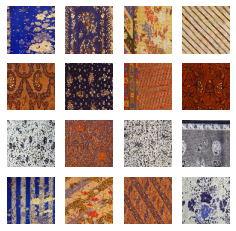

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 64 
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3  

In [ ]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))
    

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator() 

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32768)             2129920   
                                                                 
 re_lu_8 (ReLU)              (None, 32768)             0         
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 16, 16, 256)      2097152   
 ranspose)                                                       
                                                                 
 batch_normalization_6 (Batc  (None, 16, 16, 256)      1024      
 hNormalization)                                                 
                                                                 
 re_lu_9 (ReLU)              (None, 16, 16, 256)       0 

In [ ]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
#class WeightClipping(tf.keras.constraints.Constraint):
#    def __init__(self, clip_value):
#        self.clip_value = clip_value
#    
#    def __call__(self, weights):
#        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
#    
#    def get_config(self):
#       return {'clip_value': self.clip_value}

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    # Weight clipping to [-1, 1] to enfoce 1-Lipschitz constraint
    # constraint = WeightClip(0.01) # UPDATE for WGAN-GP: remove weight clipping

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), 
                            padding="same", 
                            strides=(2, 2), 
                            # kernel_constraint = constraint, # UPDATE for WGAN-GP: remove weight clipping
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), 
                            padding="same", 
                            strides=(2, 2))) 
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), 
                            padding="same", 
                            strides=(2, 2))) 
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3)) 

    # linear activation in the last layer 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3) 

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_10 (Conv2D)          (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_11 (Conv2D)          (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten_2 (Flatten)         (None, 8192)              0    

In [ ]:
class WGAN_GP(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps, 
                 gp_weight=10.0): # UPDATE for WGAN-GP: gradient penalty weight
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.gp_weight = gp_weight # WGAN-GP
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")


    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN_GP, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN-GP: use gradient penalty instead of weight clipping
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        Gradient penalty is calculated on an interpolated image
        and added to the discriminator loss.
        """
        
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        # 1. Create the interpolated image
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 2. Get the Critic's output for the interpolated image
            pred = self.critic(interpolated, training=True)

        # 3. Calculate the gradients w.r.t to the interpolated image
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 4. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        # 5. Calculate gradient penalty
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                pred_real = self.critic(real_images, training=True)
                fake_images = self.generator(noise, training=True) 
                pred_fake = self.critic(fake_images, training=True)
                # UPDATE for WGAN-GP: Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # UPDATE for WGAN-GP: Add gradient penalty to the original critic loss 
                d_loss = self.d_loss_fn(pred_real, pred_fake) + gp * self.gp_weight 
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan_gp = WGAN_GP(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) 

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.0002 # WGAN-GP paper recommends lr of 0.0002
d_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp
g_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp

In [ ]:
wgan_gp.compile(
    d_optimizer=d_optimizer,
    g_optimizer=g_optimizer,  
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/100
555/555 [==============================] - ETA: 0s - d_loss: -21.8699 - g_loss: 48.9226

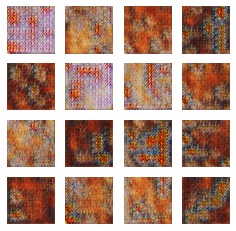

555/555 [==============================] - 200s 350ms/step - d_loss: -21.8699 - g_loss: 48.9226
Epoch 2/100
555/555 [==============================] - ETA: 0s - d_loss: -10.3393 - g_loss: -7.5289

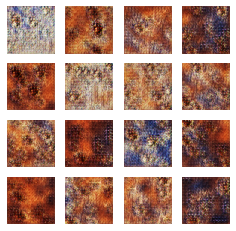

555/555 [==============================] - 194s 350ms/step - d_loss: -10.3393 - g_loss: -7.5289
Epoch 3/100
555/555 [==============================] - ETA: 0s - d_loss: -7.6442 - g_loss: -18.3581

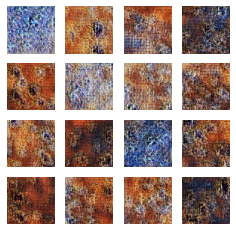

555/555 [==============================] - 195s 351ms/step - d_loss: -7.6442 - g_loss: -18.3581
Epoch 4/100
555/555 [==============================] - ETA: 0s - d_loss: -6.4075 - g_loss: -14.0973

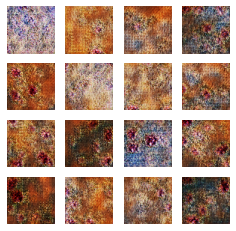

555/555 [==============================] - 195s 351ms/step - d_loss: -6.4075 - g_loss: -14.0973
Epoch 5/100
555/555 [==============================] - ETA: 0s - d_loss: -5.5544 - g_loss: -5.6618

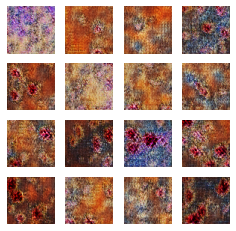

555/555 [==============================] - 195s 352ms/step - d_loss: -5.5544 - g_loss: -5.6618
Epoch 6/100
555/555 [==============================] - ETA: 0s - d_loss: -5.1410 - g_loss: 3.7775

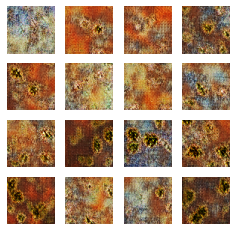

555/555 [==============================] - 195s 352ms/step - d_loss: -5.1410 - g_loss: 3.7775
Epoch 7/100
555/555 [==============================] - ETA: 0s - d_loss: -5.0515 - g_loss: 38.4725

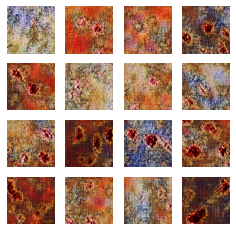

555/555 [==============================] - 196s 353ms/step - d_loss: -5.0515 - g_loss: 38.4725
Epoch 8/100
555/555 [==============================] - ETA: 0s - d_loss: -4.5568 - g_loss: 47.2090

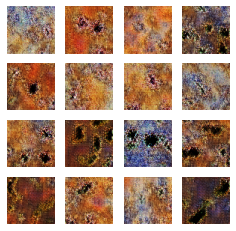

555/555 [==============================] - 195s 352ms/step - d_loss: -4.5568 - g_loss: 47.2090
Epoch 9/100
555/555 [==============================] - ETA: 0s - d_loss: -4.2417 - g_loss: 50.9022

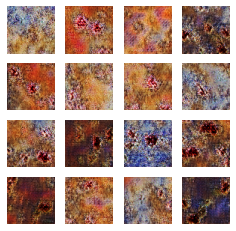

555/555 [==============================] - 195s 352ms/step - d_loss: -4.2417 - g_loss: 50.9022
Epoch 10/100
555/555 [==============================] - ETA: 0s - d_loss: -3.8128 - g_loss: 63.6591

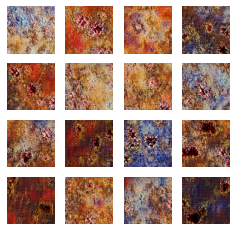

555/555 [==============================] - 196s 352ms/step - d_loss: -3.8128 - g_loss: 63.6591
Epoch 11/100
555/555 [==============================] - ETA: 0s - d_loss: -4.0064 - g_loss: 81.1925

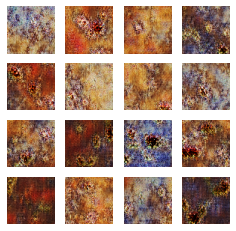

555/555 [==============================] - 195s 352ms/step - d_loss: -4.0064 - g_loss: 81.1925
Epoch 12/100
555/555 [==============================] - ETA: 0s - d_loss: -3.5523 - g_loss: 103.3250

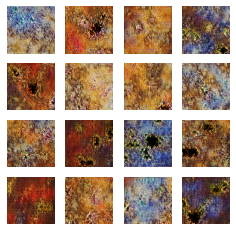

555/555 [==============================] - 195s 352ms/step - d_loss: -3.5523 - g_loss: 103.3250
Epoch 13/100
555/555 [==============================] - ETA: 0s - d_loss: -3.3240 - g_loss: 78.5153

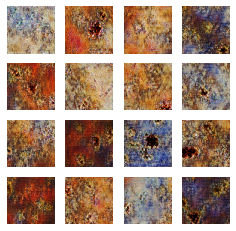

555/555 [==============================] - 195s 352ms/step - d_loss: -3.3240 - g_loss: 78.5153
Epoch 14/100
555/555 [==============================] - ETA: 0s - d_loss: -3.5860 - g_loss: 111.3417

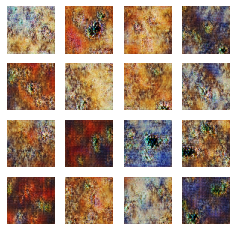

555/555 [==============================] - 196s 353ms/step - d_loss: -3.5860 - g_loss: 111.3417
Epoch 15/100
555/555 [==============================] - ETA: 0s - d_loss: -3.4615 - g_loss: 187.3474

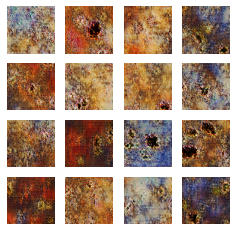

555/555 [==============================] - 195s 352ms/step - d_loss: -3.4615 - g_loss: 187.3474
Epoch 16/100
555/555 [==============================] - ETA: 0s - d_loss: -3.2394 - g_loss: 218.9922

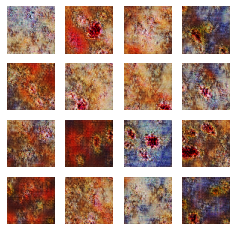

555/555 [==============================] - 195s 352ms/step - d_loss: -3.2394 - g_loss: 218.9922
Epoch 17/100
555/555 [==============================] - ETA: 0s - d_loss: -2.3321 - g_loss: 207.4983

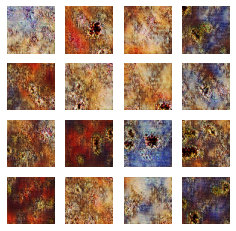

555/555 [==============================] - 195s 352ms/step - d_loss: -2.3321 - g_loss: 207.4983
Epoch 18/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5948 - g_loss: 210.9786

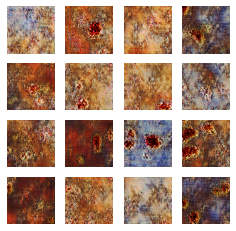

555/555 [==============================] - 195s 352ms/step - d_loss: -2.5948 - g_loss: 210.9786
Epoch 19/100
555/555 [==============================] - ETA: 0s - d_loss: -3.0909 - g_loss: 240.0749

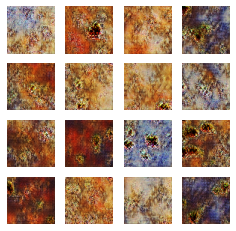

555/555 [==============================] - 195s 352ms/step - d_loss: -3.0909 - g_loss: 240.0749
Epoch 20/100
555/555 [==============================] - ETA: 0s - d_loss: -2.6529 - g_loss: 150.2500

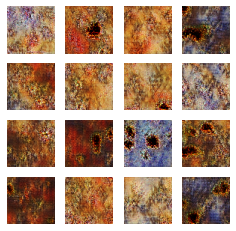

555/555 [==============================] - 195s 352ms/step - d_loss: -2.6529 - g_loss: 150.2500
Epoch 21/100
555/555 [==============================] - ETA: 0s - d_loss: -2.6937 - g_loss: 185.0881

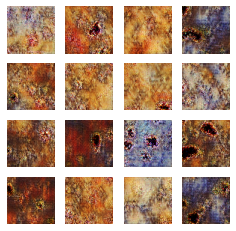

555/555 [==============================] - 195s 352ms/step - d_loss: -2.6937 - g_loss: 185.0881
Epoch 22/100
555/555 [==============================] - ETA: 0s - d_loss: -2.7663 - g_loss: 150.4603

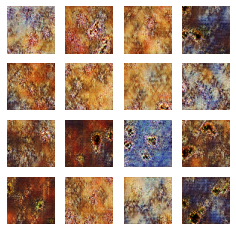

555/555 [==============================] - 196s 352ms/step - d_loss: -2.7663 - g_loss: 150.4603
Epoch 23/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5409 - g_loss: 163.4640

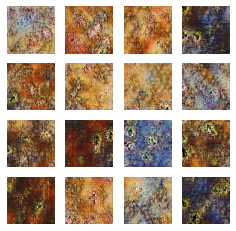

555/555 [==============================] - 195s 352ms/step - d_loss: -2.5409 - g_loss: 163.4640
Epoch 24/100
555/555 [==============================] - ETA: 0s - d_loss: -2.4055 - g_loss: 161.6954

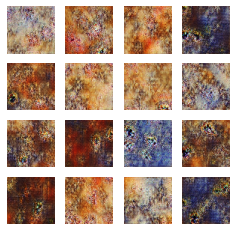

555/555 [==============================] - 195s 352ms/step - d_loss: -2.4055 - g_loss: 161.6954
Epoch 25/100
555/555 [==============================] - ETA: 0s - d_loss: -2.1049 - g_loss: 291.5373

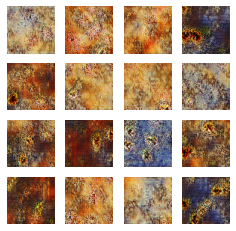

555/555 [==============================] - 195s 352ms/step - d_loss: -2.1049 - g_loss: 291.5373
Epoch 26/100
555/555 [==============================] - ETA: 0s - d_loss: -3.1262 - g_loss: 339.5769

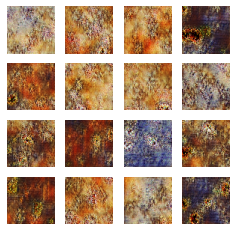

555/555 [==============================] - 195s 351ms/step - d_loss: -3.1262 - g_loss: 339.5769
Epoch 27/100
555/555 [==============================] - ETA: 0s - d_loss: -1.8575 - g_loss: 252.1153

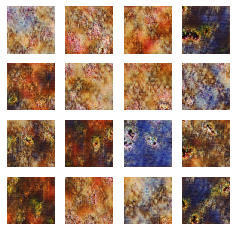

555/555 [==============================] - 195s 352ms/step - d_loss: -1.8575 - g_loss: 252.1153
Epoch 28/100
555/555 [==============================] - ETA: 0s - d_loss: -2.1979 - g_loss: 242.2949

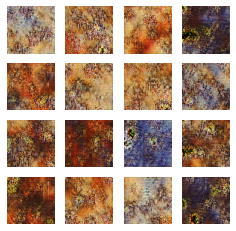

555/555 [==============================] - 195s 352ms/step - d_loss: -2.1979 - g_loss: 242.2949
Epoch 29/100
555/555 [==============================] - ETA: 0s - d_loss: -2.0624 - g_loss: 225.9272

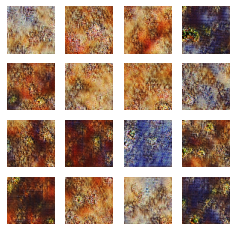

555/555 [==============================] - 196s 352ms/step - d_loss: -2.0624 - g_loss: 225.9272
Epoch 30/100
555/555 [==============================] - ETA: 0s - d_loss: -2.1547 - g_loss: 356.0724

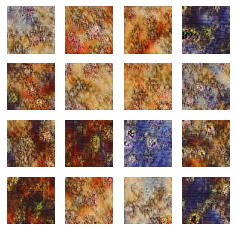

555/555 [==============================] - 195s 352ms/step - d_loss: -2.1547 - g_loss: 356.0724
Epoch 31/100
555/555 [==============================] - ETA: 0s - d_loss: -1.7282 - g_loss: 371.4024

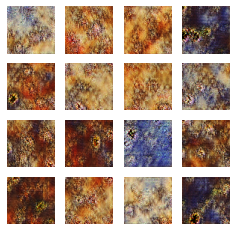

555/555 [==============================] - 195s 352ms/step - d_loss: -1.7282 - g_loss: 371.4024
Epoch 32/100
555/555 [==============================] - ETA: 0s - d_loss: -3.2959 - g_loss: 444.9952

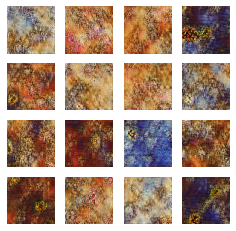

555/555 [==============================] - 195s 352ms/step - d_loss: -3.2959 - g_loss: 444.9952
Epoch 33/100
555/555 [==============================] - ETA: 0s - d_loss: -2.2267 - g_loss: 313.4049

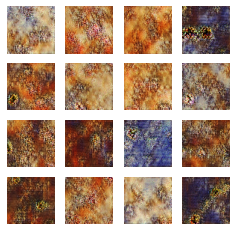

555/555 [==============================] - 195s 352ms/step - d_loss: -2.2267 - g_loss: 313.4049
Epoch 34/100
555/555 [==============================] - ETA: 0s - d_loss: -1.4642 - g_loss: 361.9685

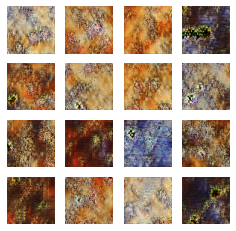

555/555 [==============================] - 195s 352ms/step - d_loss: -1.4642 - g_loss: 361.9685
Epoch 35/100
555/555 [==============================] - ETA: 0s - d_loss: -2.4388 - g_loss: 390.8061

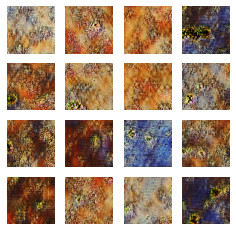

555/555 [==============================] - 195s 351ms/step - d_loss: -2.4388 - g_loss: 390.8061
Epoch 36/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5985 - g_loss: 471.3452

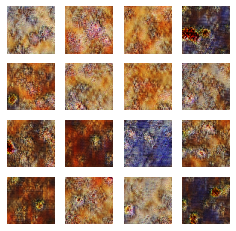

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5985 - g_loss: 471.3452
Epoch 37/100
555/555 [==============================] - ETA: 0s - d_loss: -1.7850 - g_loss: 584.8531

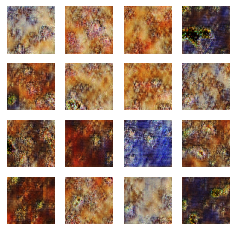

555/555 [==============================] - 195s 352ms/step - d_loss: -1.7850 - g_loss: 584.8531
Epoch 38/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5815 - g_loss: 851.7121

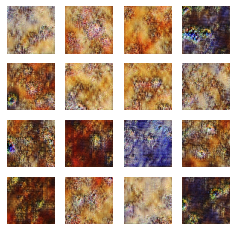

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5815 - g_loss: 851.7121
Epoch 39/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5311 - g_loss: 714.4456

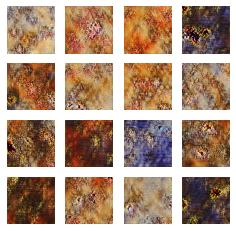

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5311 - g_loss: 714.4456
Epoch 40/100
555/555 [==============================] - ETA: 0s - d_loss: -1.2324 - g_loss: 684.2789

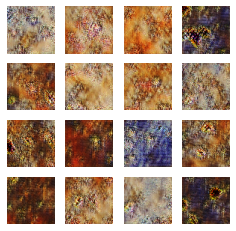

555/555 [==============================] - 195s 351ms/step - d_loss: -1.2324 - g_loss: 684.2789
Epoch 41/100
555/555 [==============================] - ETA: 0s - d_loss: -1.4336 - g_loss: 456.6375

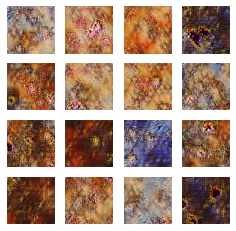

555/555 [==============================] - 195s 352ms/step - d_loss: -1.4336 - g_loss: 456.6375
Epoch 42/100
555/555 [==============================] - ETA: 0s - d_loss: -0.5235 - g_loss: 551.3144

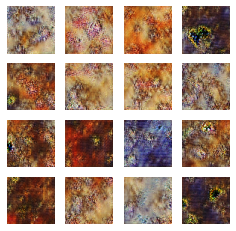

555/555 [==============================] - 195s 351ms/step - d_loss: -0.5235 - g_loss: 551.3144
Epoch 43/100
555/555 [==============================] - ETA: 0s - d_loss: -2.8494 - g_loss: 655.9140

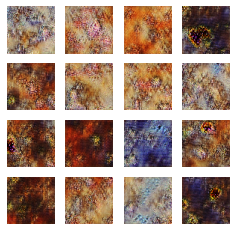

555/555 [==============================] - 195s 351ms/step - d_loss: -2.8494 - g_loss: 655.9140
Epoch 44/100
555/555 [==============================] - ETA: 0s - d_loss: -0.6089 - g_loss: 475.8954

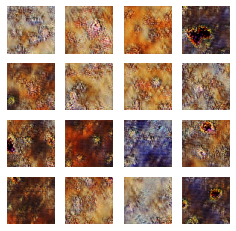

555/555 [==============================] - 195s 352ms/step - d_loss: -0.6089 - g_loss: 475.8954
Epoch 45/100
555/555 [==============================] - ETA: 0s - d_loss: -1.5452 - g_loss: 172.3405

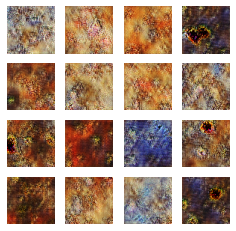

555/555 [==============================] - 195s 351ms/step - d_loss: -1.5452 - g_loss: 172.3405
Epoch 46/100
555/555 [==============================] - ETA: 0s - d_loss: -1.8781 - g_loss: 68.2599

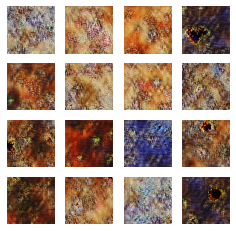

555/555 [==============================] - 195s 351ms/step - d_loss: -1.8781 - g_loss: 68.2599
Epoch 47/100
555/555 [==============================] - ETA: 0s - d_loss: -1.7220 - g_loss: 22.0142

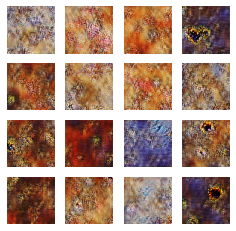

555/555 [==============================] - 195s 351ms/step - d_loss: -1.7220 - g_loss: 22.0142
Epoch 48/100
555/555 [==============================] - ETA: 0s - d_loss: -1.3550 - g_loss: -284.1074

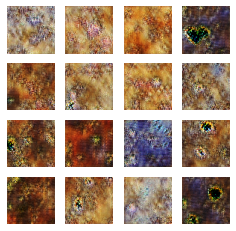

555/555 [==============================] - 195s 351ms/step - d_loss: -1.3550 - g_loss: -284.1074
Epoch 49/100
555/555 [==============================] - ETA: 0s - d_loss: -2.2207 - g_loss: -372.3500

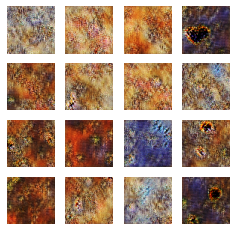

555/555 [==============================] - 193s 348ms/step - d_loss: -2.2207 - g_loss: -372.3500
Epoch 50/100
555/555 [==============================] - ETA: 0s - d_loss: -2.3454 - g_loss: -382.0528

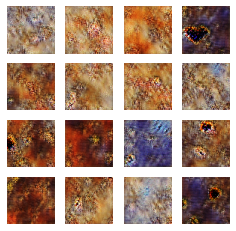

555/555 [==============================] - 195s 351ms/step - d_loss: -2.3454 - g_loss: -382.0528
Epoch 51/100
555/555 [==============================] - ETA: 0s - d_loss: -1.2927 - g_loss: -406.5875

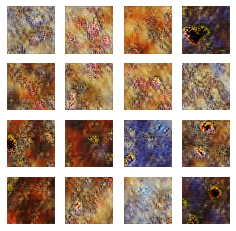

555/555 [==============================] - 195s 351ms/step - d_loss: -1.2927 - g_loss: -406.5875
Epoch 52/100
555/555 [==============================] - ETA: 0s - d_loss: -2.8479 - g_loss: -545.8800

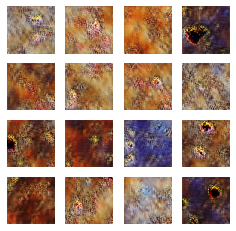

555/555 [==============================] - 195s 352ms/step - d_loss: -2.8479 - g_loss: -545.8800
Epoch 53/100
555/555 [==============================] - ETA: 0s - d_loss: -1.4946 - g_loss: -568.9465

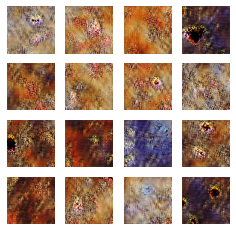

555/555 [==============================] - 195s 351ms/step - d_loss: -1.4946 - g_loss: -568.9465
Epoch 54/100
555/555 [==============================] - ETA: 0s - d_loss: -1.2638 - g_loss: -443.3394

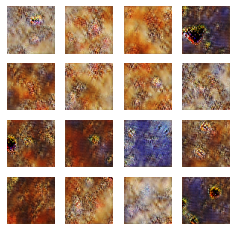

555/555 [==============================] - 195s 351ms/step - d_loss: -1.2638 - g_loss: -443.3394
Epoch 55/100
555/555 [==============================] - ETA: 0s - d_loss: -2.0546 - g_loss: -541.3107

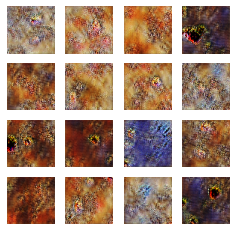

555/555 [==============================] - 195s 351ms/step - d_loss: -2.0546 - g_loss: -541.3107
Epoch 56/100
555/555 [==============================] - ETA: 0s - d_loss: -0.7784 - g_loss: -728.9492

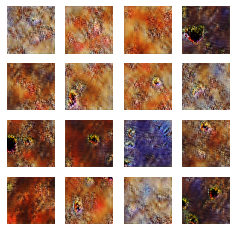

555/555 [==============================] - 195s 351ms/step - d_loss: -0.7784 - g_loss: -728.9492
Epoch 57/100
555/555 [==============================] - ETA: 0s - d_loss: -3.4191 - g_loss: -582.1809

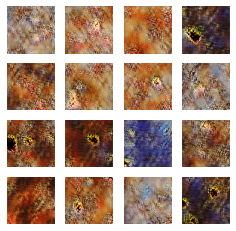

555/555 [==============================] - 195s 351ms/step - d_loss: -3.4191 - g_loss: -582.1809
Epoch 58/100
555/555 [==============================] - ETA: 0s - d_loss: -2.6424 - g_loss: -788.8019

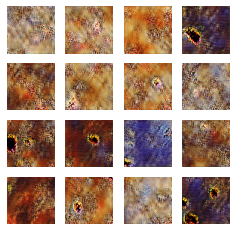

555/555 [==============================] - 195s 351ms/step - d_loss: -2.6424 - g_loss: -788.8019
Epoch 59/100
555/555 [==============================] - ETA: 0s - d_loss: -0.8660 - g_loss: -807.1210

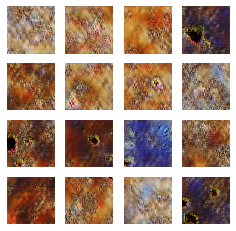

555/555 [==============================] - 195s 352ms/step - d_loss: -0.8660 - g_loss: -807.1210
Epoch 60/100
555/555 [==============================] - ETA: 0s - d_loss: -0.8711 - g_loss: -379.3903

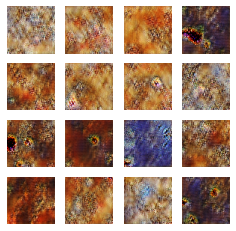

555/555 [==============================] - 195s 351ms/step - d_loss: -0.8711 - g_loss: -379.3903
Epoch 61/100
555/555 [==============================] - ETA: 0s - d_loss: -1.8945 - g_loss: -461.5061

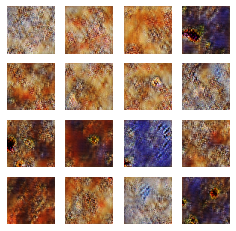

555/555 [==============================] - 195s 351ms/step - d_loss: -1.8945 - g_loss: -461.5061
Epoch 62/100
555/555 [==============================] - ETA: 0s - d_loss: -1.2470 - g_loss: -698.3577

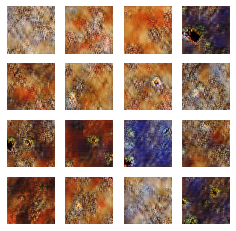

555/555 [==============================] - 195s 351ms/step - d_loss: -1.2470 - g_loss: -698.3577
Epoch 63/100
555/555 [==============================] - ETA: 0s - d_loss: -2.0226 - g_loss: -656.1228

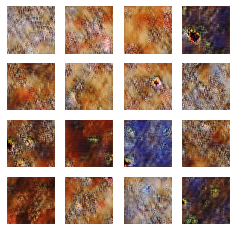

555/555 [==============================] - 195s 351ms/step - d_loss: -2.0226 - g_loss: -656.1228
Epoch 64/100
555/555 [==============================] - ETA: 0s - d_loss: -0.6958 - g_loss: -595.1706

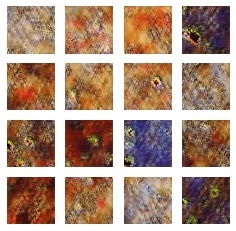

555/555 [==============================] - 195s 351ms/step - d_loss: -0.6958 - g_loss: -595.1706
Epoch 65/100
555/555 [==============================] - ETA: 0s - d_loss: -1.9055 - g_loss: -534.0919

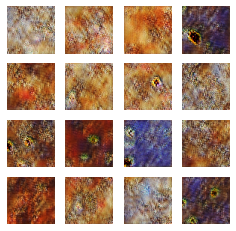

555/555 [==============================] - 195s 351ms/step - d_loss: -1.9055 - g_loss: -534.0919
Epoch 66/100
555/555 [==============================] - ETA: 0s - d_loss: -1.0820 - g_loss: -576.2109

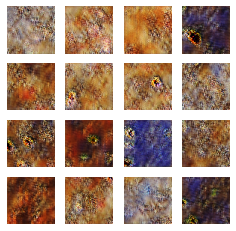

555/555 [==============================] - 195s 351ms/step - d_loss: -1.0820 - g_loss: -576.2109
Epoch 67/100
555/555 [==============================] - ETA: 0s - d_loss: -0.8090 - g_loss: -532.6533

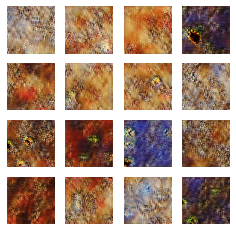

555/555 [==============================] - 195s 352ms/step - d_loss: -0.8090 - g_loss: -532.6533
Epoch 68/100
555/555 [==============================] - ETA: 0s - d_loss: -1.3851 - g_loss: -345.9135

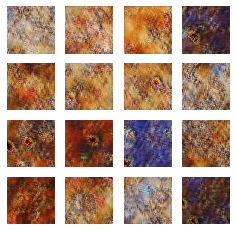

555/555 [==============================] - 195s 351ms/step - d_loss: -1.3851 - g_loss: -345.9135
Epoch 69/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5650 - g_loss: -347.7986

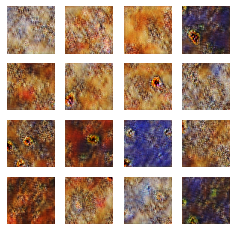

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5650 - g_loss: -347.7986
Epoch 70/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5857 - g_loss: -447.6156

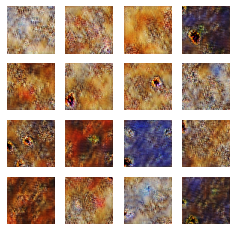

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5857 - g_loss: -447.6156
Epoch 71/100
555/555 [==============================] - ETA: 0s - d_loss: -1.2341 - g_loss: -517.9126

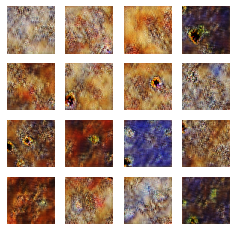

555/555 [==============================] - 195s 351ms/step - d_loss: -1.2341 - g_loss: -517.9126
Epoch 72/100
555/555 [==============================] - ETA: 0s - d_loss: -1.2126 - g_loss: -563.4608

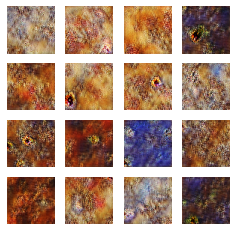

555/555 [==============================] - 195s 351ms/step - d_loss: -1.2126 - g_loss: -563.4608
Epoch 73/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5082 - g_loss: -504.8747

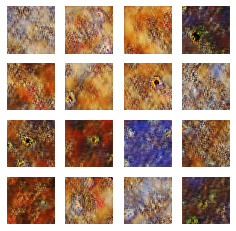

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5082 - g_loss: -504.8747
Epoch 74/100
555/555 [==============================] - ETA: 0s - d_loss: -1.1099 - g_loss: -466.6932

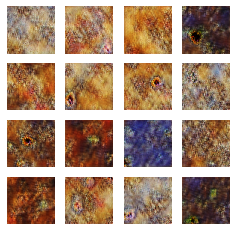

555/555 [==============================] - 195s 352ms/step - d_loss: -1.1099 - g_loss: -466.6932
Epoch 75/100
555/555 [==============================] - ETA: 0s - d_loss: -2.2393 - g_loss: -597.3939

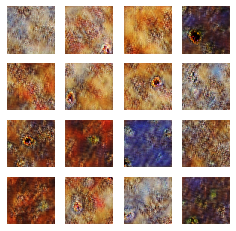

555/555 [==============================] - 195s 351ms/step - d_loss: -2.2393 - g_loss: -597.3939
Epoch 76/100
555/555 [==============================] - ETA: 0s - d_loss: -0.9655 - g_loss: -560.4643

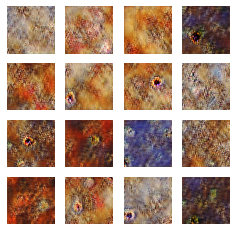

555/555 [==============================] - 195s 351ms/step - d_loss: -0.9655 - g_loss: -560.4643
Epoch 77/100
555/555 [==============================] - ETA: 0s - d_loss: -1.0279 - g_loss: -648.8087

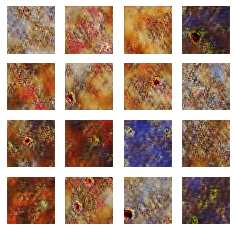

555/555 [==============================] - 195s 351ms/step - d_loss: -1.0279 - g_loss: -648.8087
Epoch 78/100
555/555 [==============================] - ETA: 0s - d_loss: -2.4236 - g_loss: -635.0524

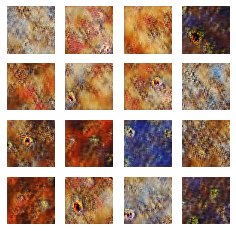

555/555 [==============================] - 195s 351ms/step - d_loss: -2.4236 - g_loss: -635.0524
Epoch 79/100
555/555 [==============================] - ETA: 0s - d_loss: -2.1662 - g_loss: -554.6882

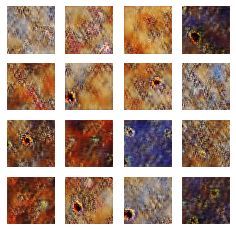

555/555 [==============================] - 195s 351ms/step - d_loss: -2.1662 - g_loss: -554.6882
Epoch 80/100
555/555 [==============================] - ETA: 0s - d_loss: -1.0767 - g_loss: -619.5669

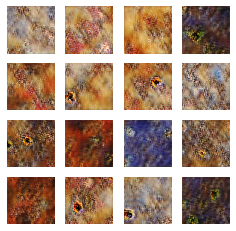

555/555 [==============================] - 195s 351ms/step - d_loss: -1.0767 - g_loss: -619.5669
Epoch 81/100
555/555 [==============================] - ETA: 0s - d_loss: -1.3694 - g_loss: -326.8123

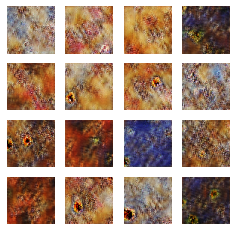

555/555 [==============================] - 195s 351ms/step - d_loss: -1.3694 - g_loss: -326.8123
Epoch 82/100
555/555 [==============================] - ETA: 0s - d_loss: -1.4503 - g_loss: -25.5014

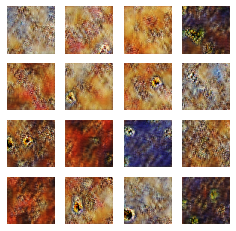

555/555 [==============================] - 195s 352ms/step - d_loss: -1.4503 - g_loss: -25.5014
Epoch 83/100
555/555 [==============================] - ETA: 0s - d_loss: -1.8261 - g_loss: 178.0854

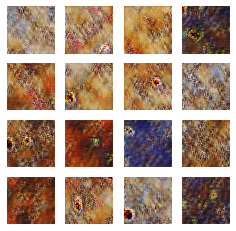

555/555 [==============================] - 195s 351ms/step - d_loss: -1.8261 - g_loss: 178.0854
Epoch 84/100
555/555 [==============================] - ETA: 0s - d_loss: -2.9227 - g_loss: 463.7848

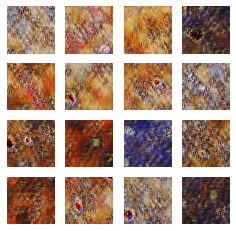

555/555 [==============================] - 195s 351ms/step - d_loss: -2.9227 - g_loss: 463.7848
Epoch 85/100
555/555 [==============================] - ETA: 0s - d_loss: -3.5805 - g_loss: 772.2289

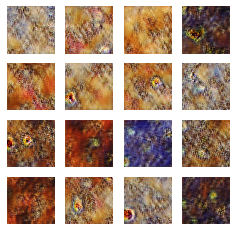

555/555 [==============================] - 195s 351ms/step - d_loss: -3.5805 - g_loss: 772.2289
Epoch 86/100
555/555 [==============================] - ETA: 0s - d_loss: -2.5464 - g_loss: 793.8002

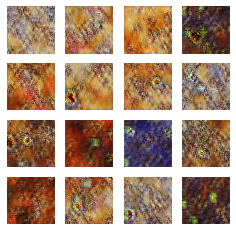

555/555 [==============================] - 195s 351ms/step - d_loss: -2.5464 - g_loss: 793.8002
Epoch 87/100
555/555 [==============================] - ETA: 0s - d_loss: -2.3851 - g_loss: 829.4977

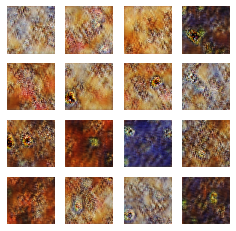

555/555 [==============================] - 195s 351ms/step - d_loss: -2.3851 - g_loss: 829.4977
Epoch 88/100
555/555 [==============================] - ETA: 0s - d_loss: -0.9663 - g_loss: 902.6742

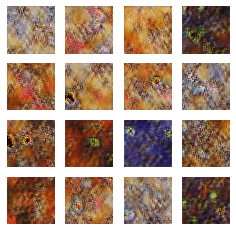

555/555 [==============================] - 195s 351ms/step - d_loss: -0.9663 - g_loss: 902.6742
Epoch 89/100
555/555 [==============================] - ETA: 0s - d_loss: -0.8085 - g_loss: 1007.0197

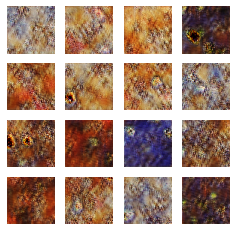

555/555 [==============================] - 195s 351ms/step - d_loss: -0.8085 - g_loss: 1007.0197
Epoch 90/100
555/555 [==============================] - ETA: 0s - d_loss: -2.0498 - g_loss: 837.0612

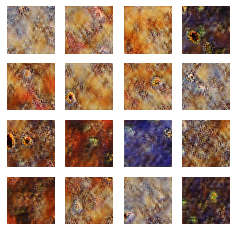

555/555 [==============================] - 195s 351ms/step - d_loss: -2.0498 - g_loss: 837.0612
Epoch 91/100
555/555 [==============================] - ETA: 0s - d_loss: -2.3504 - g_loss: 613.2211

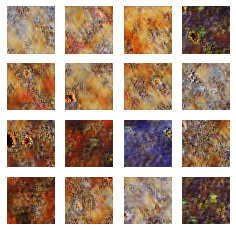

555/555 [==============================] - 195s 351ms/step - d_loss: -2.3504 - g_loss: 613.2211
Epoch 92/100
555/555 [==============================] - ETA: 0s - d_loss: -2.0890 - g_loss: 461.0770

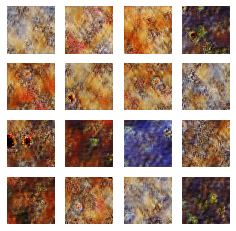

555/555 [==============================] - 195s 351ms/step - d_loss: -2.0890 - g_loss: 461.0770
Epoch 93/100
555/555 [==============================] - ETA: 0s - d_loss: -1.9386 - g_loss: 400.0073

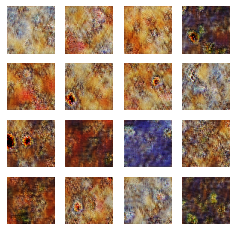

555/555 [==============================] - 195s 351ms/step - d_loss: -1.9386 - g_loss: 400.0073
Epoch 94/100
555/555 [==============================] - ETA: 0s - d_loss: -3.1544 - g_loss: 148.3856

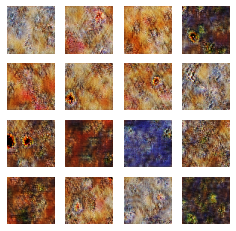

555/555 [==============================] - 195s 351ms/step - d_loss: -3.1544 - g_loss: 148.3856
Epoch 95/100
555/555 [==============================] - ETA: 0s - d_loss: -1.5351 - g_loss: 60.9656

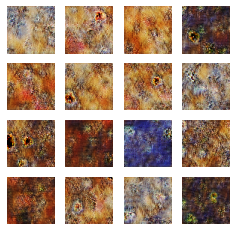

555/555 [==============================] - 195s 352ms/step - d_loss: -1.5351 - g_loss: 60.9656
Epoch 96/100
555/555 [==============================] - ETA: 0s - d_loss: -2.8915 - g_loss: 120.6775

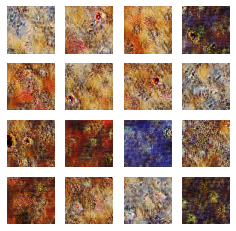

555/555 [==============================] - 195s 351ms/step - d_loss: -2.8915 - g_loss: 120.6775
Epoch 97/100
555/555 [==============================] - ETA: 0s - d_loss: -2.4559 - g_loss: 264.3063

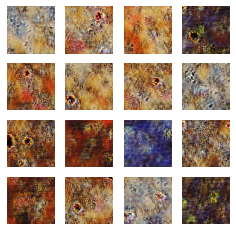

555/555 [==============================] - 195s 352ms/step - d_loss: -2.4559 - g_loss: 264.3063
Epoch 98/100
555/555 [==============================] - ETA: 0s - d_loss: -1.9809 - g_loss: 368.9626

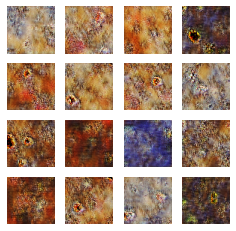

555/555 [==============================] - 195s 351ms/step - d_loss: -1.9809 - g_loss: 368.9626
Epoch 99/100
555/555 [==============================] - ETA: 0s - d_loss: -1.6798 - g_loss: 349.1968

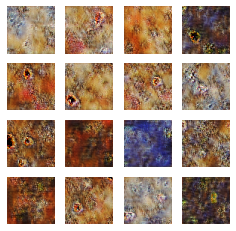

555/555 [==============================] - 195s 351ms/step - d_loss: -1.6798 - g_loss: 349.1968
Epoch 100/100
555/555 [==============================] - ETA: 0s - d_loss: -2.8781 - g_loss: 447.8896

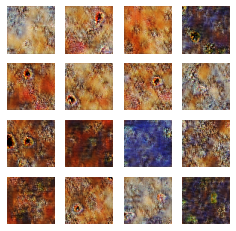

555/555 [==============================] - 195s 351ms/step - d_loss: -2.8781 - g_loss: 447.8896


In [ ]:
NUM_EPOCHS = 100 # number of epochs
wgan_gp.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])